In [ ]:
# - 전처리 후 따로 압축, 학습은 가져와서 진행

In [1]:
from google.colab import drive

drive.mount('/content/drive')

%cd /content/drive/MyDrive
%pwd

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive


'/content/drive/MyDrive'

In [2]:
%cd /content
%pwd

/content


'/content'

In [3]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 16111, done.
remote: Counting objects: 100% (22/22), done.
remote: Compressing objects: 100% (22/22), done.
remote: Total 16111 (delta 7), reused 5 (delta 0), pack-reused 16089
Receiving objects: 100% (16111/16111), 14.79 MiB | 19.51 MiB/s, done.
Resolving deltas: 100% (11031/11031), done.


In [6]:
%cd /content/yolov5/
!pip install -r requirements.txt

/content/yolov5


In [5]:
!pip install imageio
# req 설치시 에러가 떠서 이거부터 설치

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 12.0 MB/s eta 0:00:00
  Attempting uninstall: pillow
    Found existing installation: Pillow 10.1.0
    Uninstalling Pillow-10.1.0:
      Successfully uninstalled Pillow-10.1.0


In [ ]:
%cd /content/drive/MyDrive/project_pet/
!unzip pet_final2.zip -d /content/yolov5/pet_final/

In [ ]:
%mv -v /content/yolov5/pet/pet/ /content/yolov5/pet_d

renamed '/content/yolov5/pet/pet/' -> '/content/yolov5/pet_d'


In [ ]:
# 기존 파일 삭제
import shutil

shutil.rmtree('/content/yolov5/pet_d/test/labels')
shutil.rmtree('/content/yolov5/pet_d/train/labels')
shutil.rmtree('/content/yolov5/pet_d/valid/labels')
#shutil.rmtree('/content/yolov5/runs/detect')
#shutil.rmtree('/content/yolov5/runs/train')

In [ ]:
# 라벨 변경 관련 ---- 로컬에서 수행

import os
import json

# 라벨 문자열로 분류
label_mapping = {
    "A5": 0,
    "A6": 1,
    "A4": 2,
}

def map_label(label):
    # 각 레이블의 부분 문자열을 확인하고 매핑된 값을 반환
    for substring, mapped_value in label_mapping.items():
        if substring in label:
            return mapped_value
    # 매핑되지 않은 경우에는 None
    return None


def json_to_yolo(json_path, output_dir):
    # JSON 파일 읽기
    with open(json_path, 'r', encoding='utf-8') as json_file:
        json_data = json.load(json_file)

    # JSON 파일명에서 확장자를 제외한 부분 추출
    json_filename_only, _ = os.path.splitext(os.path.basename(json_path))
    label_path = os.path.join(output_dir, f"{os.path.splitext(json_filename_only)[0]}.txt")

    image_width = int(json_data["metaData"]["resolution"].split("X")[0])
    image_height = int(json_data["metaData"]["resolution"].split("X")[1])

    with open(label_path, "w") as yolo_file:
        for label_info in json_data["labelingInfo"]:
            if "box" in label_info:
                box_info = label_info["box"]["location"][0]
                x, y, width, height = box_info["x"], box_info["y"], box_info["width"], box_info["height"]

                # Convert to YOLO format
                x_center = x + width / 2
                y_center = y + height / 2
                x_normalized = x_center / image_width
                y_normalized = y_center / image_height
                width_normalized = width / image_width
                height_normalized = height / image_height

                # 파일명에서 라벨 추출
                class_label = os.path.splitext(json_filename_only)[0]

                # 라벨 변경하고 매핑
                mapped_label = map_label(class_label)

                # 라벨 생성
                if mapped_label is not None:
                    yolo_line = f"{mapped_label} {x_normalized} {y_normalized} {width_normalized} {height_normalized}\n"
                    yolo_file.write(yolo_line)


def convert_labels(input_folder_path, output_folder_path):
    # 주어진 디렉토리 내의 모든 JSON 파일을 찾아서 변환
    for json_filename in os.listdir(input_folder_path):
        if json_filename.endswith(".json"):
            json_path = os.path.join(input_folder_path, json_filename)
            json_to_yolo(json_path, output_folder_path)



In [ ]:
# 경로
input_folder_path = "D:/프로젝트자료/train2/json"
output_folder_path = "D:/프로젝트자료/train2/labels"

# 실행
convert_labels(input_folder_path, output_folder_path)

In [8]:
## 필요 라이브러리 import

import time                                                            ## 시간을 측정
import cv2                                                             ## 이미지에 변경
import numpy as np                                                     ## 수치데이터
import tensorflow as tf                                                ## 딥러닝 프레임워크
import matplotlib.pyplot as plt                                        ## 이미지 출력

## App을 사용하기 위한 설정
from absl import app, logging, flags
from absl.flags import FLAGS

## 이미지 출력
from keras.preprocessing import image
from IPython.display import Image, display

In [9]:
## 이미지파일 이름 저장

from glob import glob

In [10]:
test_img = glob('/content/yolov5/pet_final/test/images/*.jpg')
test_json = glob('/content/yolov5/pet_final/test/json/*.json')
test_labels = glob('/content/yolov5/pet_final/test/labels/*.txt')

print(len(test_img), len(test_json), len(test_labels))

700 700 700


In [11]:
valid_img = glob('/content/yolov5/pet_final/valid/images/*.jpg')
valid_json = glob('/content/yolov5/pet_final/valid/json/*.json')
valid_labels = glob('/content/yolov5/pet_final/valid/labels/*.txt')

print(len(valid_img), len(valid_json), len(valid_labels))

2200 2200 2200


In [12]:
train_img = glob('/content/yolov5/pet_final/train/images/*.jpg')
train_json = glob('/content/yolov5/pet_final/train/json/*.json')
train_labels = glob('/content/yolov5/pet_final/train/labels/*.txt')

print(len(train_img), len(train_json), len(train_labels))

5400 5400 5400


In [13]:
## yaml 파일 만들기

import yaml

with open('/content/yolov5/pet_final/train.txt', 'w') as f:
  f.write('\n'.join(train_img)+'\n')
with open('/content/yolov5/pet_final/test.txt', 'w') as f:
  f.write('\n'.join(test_img)+'\n')
with open('/content/yolov5/pet_final/valid.txt', 'w') as f:
  f.write('\n'.join(valid_img)+'\n')

In [ ]:
# 하나만 혹시몰라 확인
%cat '/content/yolov5/pet_final/test.txt'

In [14]:
## 템플릿

from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell) :
  with open(line, 'w') as f :
    f.write(cell.format(**globals()))

In [15]:
%%writetemplate /content/yolov5/pet_final/data.yaml

train: ../pet_final/train/images
test: ../pet_final/test/images
val: ../pet_final/valid/images

nc: 3
names: ['erosion/ulcer', 'nodule/tumor', 'pustule/acne']

In [16]:
%cat /content/yolov5/pet_final/data.yaml


train: ../pet_final/train/images
test: ../pet_final/test/images
val: ../pet_final/valid/images

nc: 3
names: ['erosion/ulcer', 'nodule/tumor', 'pustule/acne']


In [ ]:
## 모델 구성

import yaml

%cat /content/yolov5/models/yolov5n.yaml

In [17]:
%%writetemplate /content/yolov5/models/custom_yolov5n.yaml


# Parameters
nc: 3  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.25  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [ ]:
%cat '/content/yolov5/models/custom_yolov5n.yaml'



# Parameters
nc: 3  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.25  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, F

In [ ]:
## 학습 진행

%%time
%cd /content/yolov5/
!python train.py --img 640 --batch 32 --epochs 50 --data ./pet_final/data.yaml --cfg ./models/custom_yolov5n.yaml --weights '/content/best.pt' --name pet_result --cache

In [ ]:
## 학습 진행

%%time
%cd /content/yolov5/
!python train.py --img 640 --batch 8 --epochs 50 --data ./pet_final/data.yaml --cfg ./models/custom_yolov5n.yaml --weights '/content/yolov5/runs/train/pet_result/weights/best.pt' --name pet_result --cache

In [ ]:
## 학습 진행

%%time
%cd /content/yolov5/
!python train.py --img 640 --batch 16 --epochs 100 --data ./pet_final/data.yaml --cfg ./models/custom_yolov5n.yaml --weights '/content/yolov5/runs/train/pet_result2/weights/best.pt' --name pet_result --cache

In [21]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
Image(filename='/content/yolov5/runs/train/pet_result3/results.png', width=800)

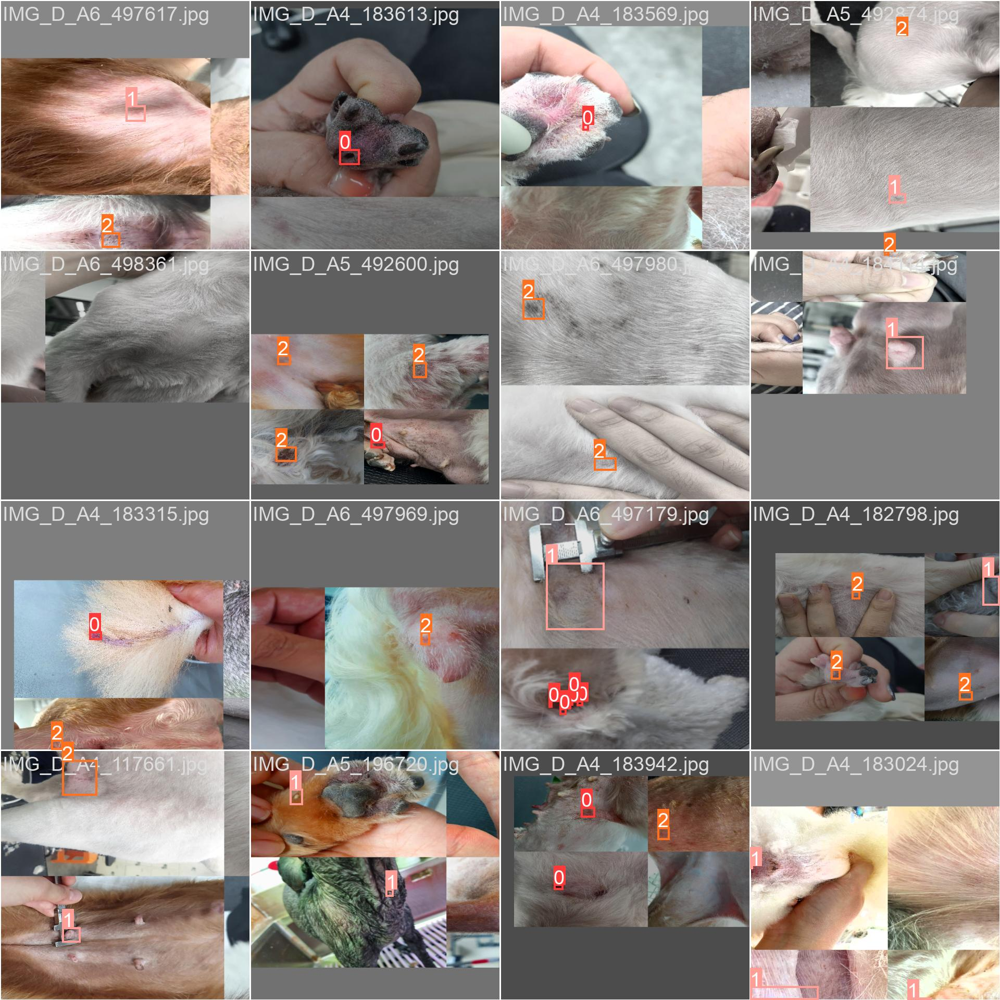

In [23]:
Image(filename='/content/yolov5/runs/train/pet_result3/train_batch0.jpg', width=600)

In [24]:
!python detect.py --weight /content/yolov5/runs/train/pet_result3/weights/best.pt --img 640 --conf 0.6 --source /content/yolov5/pet_final/test/images

detect: weights=['/content/yolov5/runs/train/pet_result3/weights/best.pt'], source=/content/yolov5/pet_final/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.6, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-253-g63555c8 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5n summary: 157 layers, 1763224 parameters, 0 gradients, 4.1 GFLOPs
image 1/700 /content/yolov5/pet_final/test/images/IMG_D_A4_194770.jpg: 384x640 (no detections), 72.2ms
image 2/700 /content/yolov5/pet_final/test/images/IMG_D_A4_194771.jpg: 384x640 (no detections), 8.0ms
image 3/700 /content/yolov5/pet_final/test/images/IMG_D_A4_194772.jpg: 384x6

In [32]:
!python detect.py --weight /content/last_1218.pt --img 640 --conf 0.6 --source /content/yolov5/pet_final/test/images

detect: weights=['/content/last_1218.pt'], source=/content/yolov5/pet_final/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.6, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-253-g63555c8 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5n summary: 157 layers, 1763224 parameters, 0 gradients, 4.1 GFLOPs
image 1/700 /content/yolov5/pet_final/test/images/IMG_D_A4_194770.jpg: 384x640 (no detections), 49.1ms
image 2/700 /content/yolov5/pet_final/test/images/IMG_D_A4_194771.jpg: 384x640 (no detections), 6.2ms
image 3/700 /content/yolov5/pet_final/test/images/IMG_D_A4_194772.jpg: 384x640 (no detections), 6.0ms
image 4

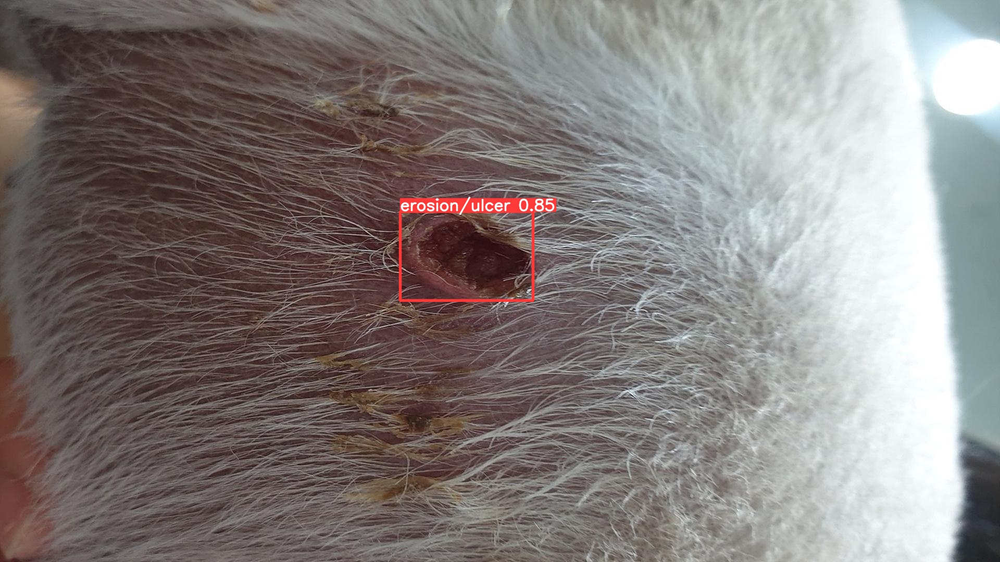

/content/yolov5/runs/detect/exp2/IMG_D_A5_490650.jpg


In [33]:
from IPython.display import Image, display
import random
import glob

image_name = random.choice(glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'))
display(Image(filename = image_name))
print(image_name)

In [ ]:
!zip -r /content/runs.zip /content/yolov5/runs/

In [ ]:
!pip install Flask